<a href="https://colab.research.google.com/github/teofeliu/fireworks-ocr/blob/main/ID_Preprocessing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!unzip /content/og.zip
!unzip /content/driving_license.zip
!unzip /content/archive.zip

Archive:  /content/og.zip
   creating: og/
   creating: og/original/
  inflating: __MACOSX/og/._original  
  inflating: og/original/8.png       
  inflating: __MACOSX/og/original/._8.png  
  inflating: og/original/9.png       
  inflating: __MACOSX/og/original/._9.png  
  inflating: og/original/14.png      
  inflating: __MACOSX/og/original/._14.png  
  inflating: og/original/15.png      
  inflating: __MACOSX/og/original/._15.png  
  inflating: og/original/17.png      
  inflating: __MACOSX/og/original/._17.png  
  inflating: og/original/16.png      
  inflating: __MACOSX/og/original/._16.png  
  inflating: og/original/12.png      
  inflating: __MACOSX/og/original/._12.png  
  inflating: og/original/13.png      
  inflating: __MACOSX/og/original/._13.png  
  inflating: og/original/11.png      
  inflating: __MACOSX/og/original/._11.png  
  inflating: og/original/10.png      
  inflating: __MACOSX/og/original/._10.png  
  inflating: og/original/21.png      
  inflating: __MACOSX/og/or

In [ ]:
!unzip /content/driving_license.zip

Archive:  /content/driving_license.zip
   creating: driving license/
  inflating: __MACOSX/._driving license  
  inflating: driving license/README.roboflow.txt  
  inflating: __MACOSX/driving license/._README.roboflow.txt  
   creating: driving license/valid/
  inflating: __MACOSX/driving license/._valid  
  inflating: driving license/README.dataset.txt  
  inflating: __MACOSX/driving license/._README.dataset.txt  
   creating: driving license/test/
  inflating: __MACOSX/driving license/._test  
   creating: driving license/train/
  inflating: __MACOSX/driving license/._train  
  inflating: driving license/valid/ohio_fake_id-scaled-e1601112387239_jpg.rf.f9804a65c1e2cbe6e1a628ed165410f9.jpg  
  inflating: __MACOSX/driving license/valid/._ohio_fake_id-scaled-e1601112387239_jpg.rf.f9804a65c1e2cbe6e1a628ed165410f9.jpg  
  inflating: driving license/valid/1_jpg.rf.dc2937445183f49c01e843ebc0422520.jpg  
  inflating: __MACOSX/driving license/valid/._1_jpg.rf.dc2937445183f49c01e843ebc0422520.j

In [ ]:
import shutil
import os

# Replace 'directory_path' with the path to the directory you want to delete
directory_path = '/content/rotated_images_augmented_pixelated'

if os.path.exists(directory_path):
    shutil.rmtree(directory_path)
    print(f"Directory {directory_path} has been deleted.")
else:
    print(f"Directory {directory_path} does not exist.")

Directory /content/rotated_images_augmented_pixelated has been deleted.


In [ ]:
import os
from PIL import Image, ImageEnhance
import pandas as pd
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import resnet50, ResNet50_Weights
import matplotlib.pyplot as plt
import random

def initial_resize(image, max_size=800):
    """Resize image to have a maximum dimension of max_size while maintaining aspect ratio."""
    width, height = image.size
    if max(width, height) > max_size:
        ratio = max_size / max(width, height)
        new_size = (int(width * ratio), int(height * ratio))
        return image.resize(new_size, Image.LANCZOS)
    return image

def apply_pixelation(image, block_size=8):
    """Apply a pixelation effect to the image."""
    width, height = image.size
    small = image.resize((width // block_size, height // block_size), resample=Image.BILINEAR)
    return small.resize(image.size, Image.NEAREST)

def apply_random_transformations(image):
    # Random brightness adjustment
    enhancer = ImageEnhance.Brightness(image)
    factor = random.uniform(0.8, 1.2)
    image = enhancer.enhance(factor)

    # Random contrast adjustment
    enhancer = ImageEnhance.Contrast(image)
    factor = random.uniform(0.8, 1.2)
    image = enhancer.enhance(factor)

    # Random affine transformation
    width, height = image.size
    max_dx = width * 0.05  # 5% of width
    max_dy = height * 0.05  # 5% of height
    dx = random.uniform(-max_dx, max_dx)
    dy = random.uniform(-max_dy, max_dy)
    image = image.transform(image.size, Image.AFFINE, (1, 0, dx, 0, 1, dy))

    return image

def rotate_and_pad_image(image, angle):
    image = image.convert('RGB')
    max_dim = max(image.size)
    square_img = Image.new("RGB", (max_dim, max_dim), (255, 255, 255))
    paste_box = ((max_dim - image.size[0]) // 2, (max_dim - image.size[1]) // 2)
    square_img.paste(image, paste_box)
    rotated_img = square_img.rotate(angle, expand=False)
    return rotated_img

def create_rotated_dataset(input_folders, output_folder, augmentations_per_image=2):
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)

    data = []
    rotation_angles = list(range(0, 346, 15))

    for input_folder in input_folders:
        for filename in os.listdir(input_folder):
            if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
                img_path = os.path.join(input_folder, filename)
                try:
                    img = Image.open(img_path)
                    img = initial_resize(img)  # Apply initial resizing

                    # Process original image
                    for angle in rotation_angles:
                        rotated_img = rotate_and_pad_image(img, angle)
                        new_filename = f"{os.path.splitext(filename)[0]}_orig_{angle}.png"
                        output_path = os.path.join(output_folder, new_filename)
                        rotated_img.save(output_path, optimize=True, quality=85)  # Optimize saving
                        data.append({'original_image': filename, 'rotated_image': new_filename, 'rotation_angle': angle})

                    # Process pixelated image
                    pixelated_img = apply_pixelation(img)
                    for angle in rotation_angles:
                        rotated_img = rotate_and_pad_image(pixelated_img, angle)
                        new_filename = f"{os.path.splitext(filename)[0]}_pixelated_{angle}.png"
                        output_path = os.path.join(output_folder, new_filename)
                        rotated_img.save(output_path, optimize=True, quality=85)  # Optimize saving
                        data.append({'original_image': filename, 'rotated_image': new_filename, 'rotation_angle': angle})

                    # Process augmented images
                    for i in range(augmentations_per_image):
                        augmented_img = apply_random_transformations(img)
                        for angle in rotation_angles:
                            rotated_img = rotate_and_pad_image(augmented_img, angle)
                            new_filename = f"{os.path.splitext(filename)[0]}_aug{i}_{angle}.png"
                            output_path = os.path.join(output_folder, new_filename)
                            rotated_img.save(output_path, optimize=True, quality=85)  # Optimize saving
                            data.append({'original_image': filename, 'rotated_image': new_filename, 'rotation_angle': angle})

                except Exception as e:
                    print(f"Error processing {filename}: {str(e)}")

    df = pd.DataFrame(data)
    df.to_csv(os.path.join(output_folder, 'rotation_dataset.csv'), index=False)

    print(f"Dataset created with {len(data)} images.")
    return df

class RotatedImageDataset(Dataset):
    def __init__(self, csv_file, img_dir, transform=None):
        self.data = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        img_name = self.data.iloc[idx, 1]
        img_path = os.path.join(self.img_dir, img_name)
        image = Image.open(img_path).convert('RGB')
        angle = self.data.iloc[idx, 2]

        if self.transform:
            image = self.transform(image)

        return image, angle

def prepare_data_for_resnet(input_folders, output_folder, batch_size=32, augmentations_per_image=5):
    # Create the dataset
    df = create_rotated_dataset(input_folders, output_folder, augmentations_per_image)

    # Define transformations
    transform = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # Create dataset and dataloader
    dataset = RotatedImageDataset(
        csv_file=os.path.join(output_folder, 'rotation_dataset.csv'),
        img_dir=output_folder,
        transform=transform
    )
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)

    return dataloader, dataset

# Usage
input_folders = ['/content/driving_license/train', '/content/og/original', '/content/archive/images']
output_folder = '/content/rotated_images_augmented_pixelated'
dataloader, dataset = prepare_data_for_resnet(input_folders, output_folder, augmentations_per_image=5)

# Display sample datapoints
display_sample_datapoints(dataset, num_samples=15)

print("Dataset prepared and samples displayed")

In [ ]:
import os
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader

class SimpleImageDataset(Dataset):
    def __init__(self, img_dir):
        self.img_dir = img_dir
        self.img_files = [f for f in os.listdir(img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_name = self.img_files[idx]
        img_path = os.path.join(self.img_dir, img_name)
        image = Image.open(img_path).convert('RGB')

        # Convert PIL Image to tensor
        image = torch.from_numpy(np.array(image)).permute(2, 0, 1).float() / 255.0

        # Extract angle from filename (assuming format like "image_name_angle.jpg")
        angle = int(img_name.split('_')[-1].split('.')[0])

        return image, angle

def create_dataloader(folder_path, batch_size=32):
    dataset = SimpleImageDataset(folder_path)
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    return dataloader

# Create validation and test dataloaders
val_dataloader = create_dataloader('/content/driving_license/valid')
test_dataloader = create_dataloader('/content/driving_license/test')

print(f"Validation dataloader created with {len(val_dataloader.dataset)} images.")
print(f"Test dataloader created with {len(test_dataloader.dataset)} images.")

In [ ]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import random

class RotationDataset(Dataset):
    def __init__(self, image_folder, transform=None):
        self.image_folder = image_folder
        self.image_files = [f for f in os.listdir(image_folder) if f.endswith('.png')]
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.image_folder, img_name)
        image = Image.open(img_path).convert('RGB')

        # Extract rotation angle from filename
        angle = int(img_name.split('_')[-1].split('.')[0])

        if self.transform:
            image = self.transform(image)

        return image, angle

def create_data_loaders(image_folder, batch_size=32, val_split=0.2):
    # Define transformations
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # Create full dataset
    full_dataset = RotationDataset(image_folder, transform=transform)

    # Calculate split sizes
    dataset_size = len(full_dataset)
    val_size = int(val_split * dataset_size)
    train_size = dataset_size - val_size

    # Split the dataset
    train_dataset, val_dataset = torch.utils.data.random_split(full_dataset, [train_size, val_size])

    # Create data loaders
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

    return train_loader, val_loader

# Usage
image_folder = '/content/rotated_images_augmented_pixelated'
batch_size = 32
val_split = 0.2

train_loader, val_loader = create_data_loaders(image_folder, batch_size, val_split)

# Print some information about the data loaders
print(f"Number of training batches: {len(train_loader)}")
print(f"Number of validation batches: {len(val_loader)}")

# Verify the data
for images, angles in train_loader:
    print(f"Batch shape: {images.shape}")
    print(f"Angles shape: {angles.shape}")
    print(f"Sample angles: {angles[:5]}")
    break  # Just print the first batch

Number of training batches: 1523
Number of validation batches: 381
Batch shape: torch.Size([32, 3, 224, 224])
Angles shape: torch.Size([32])
Sample angles: tensor([ 45,  45, 345, 345, 180])


In [ ]:
import torch
from torch.utils.data import RandomSampler

# Assuming 'dataloader' and 'dataset' are already defined

# Basic information
print(f"Batch size: {dataloader.batch_size}")

# Get a batch of data
images, labels = next(iter(dataloader))

print(f"Image dimensions: {images.shape}")
print(f"Image data type: {images.dtype}")
print(f"Label data type: {labels.dtype}")

# Number of classes (assuming labels are 0-indexed and continuous)
num_classes = len(torch.unique(labels))
print(f"Number of classes: {num_classes}")

# Shape of a single image
print(f"Shape of a single image: {images[0].shape}")

# Total number of samples
print(f"Total number of samples in the dataset: {len(dataset)}")

# Check if shuffling is enabled
is_shuffled = isinstance(dataloader.sampler, RandomSampler)
print(f"Shuffle: {is_shuffled}")

# Number of workers
print(f"Number of workers: {dataloader.num_workers}")

# Pin memory status
print(f"Pin memory: {dataloader.pin_memory}")

# Collate function
print(f"Collate function: {dataloader.collate_fn.__name__ if dataloader.collate_fn else 'Default'}")

# Dataset and Dataloader sizes
num_batches = len(dataloader)
print(f"Number of batches in dataloader: {num_batches}")
print(f"Dataset size: {len(dataset)}")
print(f"Dataloader size (dataset size / batch size): {len(dataset) / dataloader.batch_size:.2f}")

In [ ]:
train_loader = dataloader
val_loader = val_dataloader

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models
from tqdm import tqdm

# Define the model
class RotationRegressionModel(nn.Module):
    def __init__(self):
        super(RotationRegressionModel, self).__init__()
        # Load pre-trained ResNet18
        self.resnet = models.resnet18(pretrained=True)
        # Replace the last fully connected layer
        num_ftrs = self.resnet.fc.in_features
        self.resnet.fc = nn.Sequential(
            nn.Linear(num_ftrs, 256),
            nn.ReLU(),
            nn.Linear(256, 1)  # Output a single value for regression
        )

    def forward(self, x):
        return self.resnet(x)

# Initialize model, loss function, and optimizer
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = RotationRegressionModel().to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
# Evaluation function
def evaluate_model(model, val_loader):
    model.eval()
    total_loss = 0.0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device).float()
            labels = labels / 345.0  # Normalize labels

            outputs = model(inputs).squeeze()
            loss = criterion(outputs, labels)
            total_loss += loss.item() * inputs.size(0)

    avg_loss = total_loss / len(val_loader.dataset)
    print(f"Validation Loss: {avg_loss:.4f}")
    return avg_loss

In [ ]:
evaluate_model(model, val_loader)

Validation Loss: 0.5545


0.5544898336415768

In [ ]:
from torch.utils.tensorboard import SummaryWriter

In [ ]:
# Set up TensorBoard
log_dir = 'runs/rotation_regression_experiment'
writer = SummaryWriter(log_dir)

# Training function
def train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs=10):
    best_val_loss = float('inf')
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")
        for batch_idx, (inputs, labels) in enumerate(pbar):
            inputs = inputs.to(device)
            labels = labels.to(device).float()  # Convert to float for regression
            labels = labels / 345.0  # Normalize labels to [0, 1] range

            optimizer.zero_grad()
            outputs = model(inputs).squeeze()
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            pbar.set_postfix({'loss': loss.item()})

            # Log training loss to TensorBoard
            writer.add_scalar('Training loss', loss.item(), epoch * len(train_loader) + batch_idx)

        epoch_loss = running_loss / len(train_loader.dataset)
        print(f"Epoch {epoch+1} training loss: {epoch_loss:.4f}")

        # Evaluate on validation set
        val_loss = evaluate_model(model, val_loader, criterion)
        print(f"Epoch {epoch+1} validation loss: {val_loss:.4f}")

        # Log validation loss to TensorBoard
        writer.add_scalar('Validation loss', val_loss, epoch)

        # Save best model
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            torch.save(model.state_dict(), 'best_rotation_regression_model.pth')
            print(f"New best model saved with validation loss: {best_val_loss:.4f}")

    writer.close()

# Evaluation function
def evaluate_model(model, val_loader, criterion):
    model.eval()
    total_loss = 0.0
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs = inputs.to(device)
            labels = labels.to(device).float()
            labels = labels / 345.0  # Normalize labels

            outputs = model(inputs).squeeze()
            loss = criterion(outputs, labels)
            total_loss += loss.item() * inputs.size(0)

    avg_loss = total_loss / len(val_loader.dataset)
    return avg_loss

# Function to predict rotation
def predict_rotation(model, image):
    model.eval()
    with torch.no_grad():
        output = model(image.unsqueeze(0).to(device)).squeeze()
        predicted_angle = output.item() * 345.0  # Denormalize
    return predicted_angle

# Train the model
num_epochs = 10
train_model(model, train_loader, val_loader, criterion, optimizer, num_epochs)

# Evaluate the model
evaluate_model(model, val_loader)

# Save the model
torch.save(model.state_dict(), 'rotation_regression_model.pth')

Epoch 1/10: 100%|██████████| 1523/1523 [02:29<00:00, 10.15it/s, loss=0.00016]

Epoch 1 training loss: 0.0036


Epoch 1 validation loss: 0.0001
New best model saved with validation loss: 0.0001


Epoch 2/10: 100%|██████████| 1523/1523 [02:30<00:00, 10.12it/s, loss=0.00191]

Epoch 2 training loss: 0.0010


Epoch 2 validation loss: 0.0029


Epoch 3/10: 100%|██████████| 1523/1523 [02:30<00:00, 10.12it/s, loss=0.00013]

Epoch 3 training loss: 0.0002


Epoch 3 validation loss: 0.0000
New best model saved with validation loss: 0.0000


Epoch 4/10: 100%|██████████| 1523/1523 [02:30<00:00, 10.12it/s, loss=0.000743]

Epoch 4 training loss: 0.0001


Epoch 4 validation loss: 0.0005


Epoch 5/10: 100%|██████████| 1523/1523 [02:30<00:00, 10.14it/s, loss=0.00559]

Epoch 5 training loss: 0.0016


Epoch 5 validation loss: 0.0019


Epoch 6/10: 100%|██████████| 1523/1523 [02:29<00:00, 10.19it/s, loss=0.000307]

Epoch 6 training loss: 0.0004


Epoch 6 validation loss: 0.0006


Epoch 7/10: 100%|██████████| 1523/1523 [02:30<00:00, 10.14it/s, loss=7.74e-5]

Epoch 7 training loss: 0.0003


Epoch 7 validation loss: 0.0000
New best model saved with validation loss: 0.0000


Epoch 8/10: 100%|██████████| 1523/1523 [02:30<00:00, 10.13it/s, loss=2.09e-5]

Epoch 8 training loss: 0.0001


Epoch 8 validation loss: 0.0000
New best model saved with validation loss: 0.0000


Epoch 9/10: 100%|██████████| 1523/1523 [02:30<00:00, 10.15it/s, loss=0.000136]

Epoch 9 training loss: 0.0001


Epoch 9 validation loss: 0.0000
New best model saved with validation loss: 0.0000


Epoch 10/10: 100%|██████████| 1523/1523 [02:29<00:00, 10.17it/s, loss=4.35e-5]

Epoch 10 training loss: 0.0007


Epoch 10 validation loss: 0.0000


TypeError: evaluate_model() missing 1 required positional argument: 'criterion'

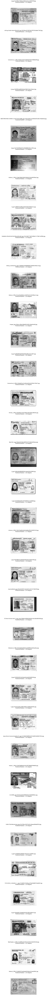

In [ ]:
import os
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

def load_and_preprocess_image(image_path):
    # Open the image
    img = Image.open(image_path).convert('RGB')

    # Get the longest dimension
    long_side = max(img.size)

    # Create a square white background
    square_img = Image.new('RGB', (long_side, long_side), (255, 255, 255))

    # Paste the original image onto the square background
    paste_coords = ((long_side - img.size[0]) // 2, (long_side - img.size[1]) // 2)
    square_img.paste(img, paste_coords)

    # Define the transformation pipeline
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    # Apply the transformations
    img_tensor = transform(square_img)

    return img_tensor, square_img

def predict_rotations(model, image_folder):
    model.eval()
    results = []

    for filename in os.listdir(image_folder):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg')):
            image_path = os.path.join(image_folder, filename)
            img_tensor, original_img = load_and_preprocess_image(image_path)

            with torch.no_grad():
                output = model(img_tensor.unsqueeze(0).to(device)).squeeze()
                predicted_angle = output.item() * 345.0  # Denormalize

            results.append((filename, original_img, predicted_angle))

    return results

def display_results(results):
    num_images = len(results)
    fig, axes = plt.subplots(num_images, 1, figsize=(10, 5 * num_images))
    if num_images == 1:
        axes = [axes]

    for ax, (filename, img, angle) in zip(axes, results):
        ax.imshow(img)
        ax.set_title(f"{filename}\nPredicted Rotation: {angle:.2f} degrees")
        ax.axis('off')

    plt.tight_layout()
    plt.show()

image_folder = '/content/driving_license/test'

results = predict_rotations(model, image_folder)

display_results(results)

In [19]:
!unzip /content/ids.zip

Archive:  /content/ids.zip
   creating: ids/
  inflating: ids/New-York-.rf.4ba2e07e8ac8df07d1757eb5eaf5deaa.png  
  inflating: __MACOSX/ids/._New-York-.rf.4ba2e07e8ac8df07d1757eb5eaf5deaa.png  
  inflating: ids/Hawaii_1_PNG.rf.2647bb8fe40316143f5788bdf7699b58.png  
  inflating: __MACOSX/ids/._Hawaii_1_PNG.rf.2647bb8fe40316143f5788bdf7699b58.png  
  inflating: ids/21.png              
  inflating: __MACOSX/ids/._21.png   
  inflating: ids/NEW-YORK-FAKE-ID-NEW-2-e1547755223686_jpg.rf.5051409711b26f2b0cf0cd8c748a0b36.png  
  inflating: __MACOSX/ids/._NEW-YORK-FAKE-ID-NEW-2-e1547755223686_jpg.rf.5051409711b26f2b0cf0cd8c748a0b36.png  
  inflating: ids/Washington_2_PNG.rf.c4eff82ad12f20ce4144215afe59324d.png  
  inflating: __MACOSX/ids/._Washington_2_PNG.rf.c4eff82ad12f20ce4144215afe59324d.png  
  inflating: ids/VT-driver-license-new-1-copy_png.rf.b6be1d38063ebd2bc3dc2dd2e8f5cfb8.png  
  inflating: __MACOSX/ids/._VT-driver-license-new-1-copy_png.rf.b6be1d38063ebd2bc3dc2dd2e8f5cfb8.png  
  in

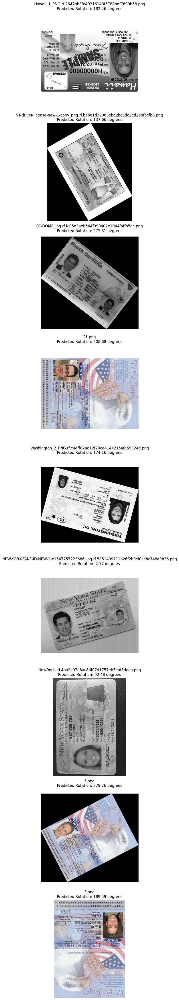

In [21]:
# Specify the folder containing your test images
image_folder = '/content/ids'

# Predict rotations for all images in the folder
results = predict_rotations(model, image_folder)

# Display the results
display_results(results)

In [17]:
# In your Colab notebook, after training:
torch.save(model.state_dict(), 'rotation_regression_model.pth')

# Download the file to your local machine
from google.colab import files
files.download('rotation_regression_model.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>